In [22]:
import numpy as np
import pandas as pd
import extra_files.helper as hp

In [23]:
path_root = '/home/aldo/Documents/data-cic/preprocess_data/predictions/'
path = '/home/aldo/Documents/data-cic/preprocess_data/'
test_images_300 = np.load(path + 'images_test_300x300.npy')

label_test = np.load(path + '/label_test.npy')
pred_voc_07_12_coco_300x300_test = np.load(path_root + 'pred_voc_07_12_coco_300x300_test.npy')

In [24]:
# Remove class and confidence from predictions
pred_voc_07_12_coco_300x300_test = hp.get_coordinates(pred_voc_07_12_coco_300x300_test)

In [25]:
pred_voc_07_12_coco_300x300_test = hp.normilize_to_pixel(pred_voc_07_12_coco_300x300_test, 300, 300)
label_test = hp.normilize_to_pixel(label_test, 300, 300)

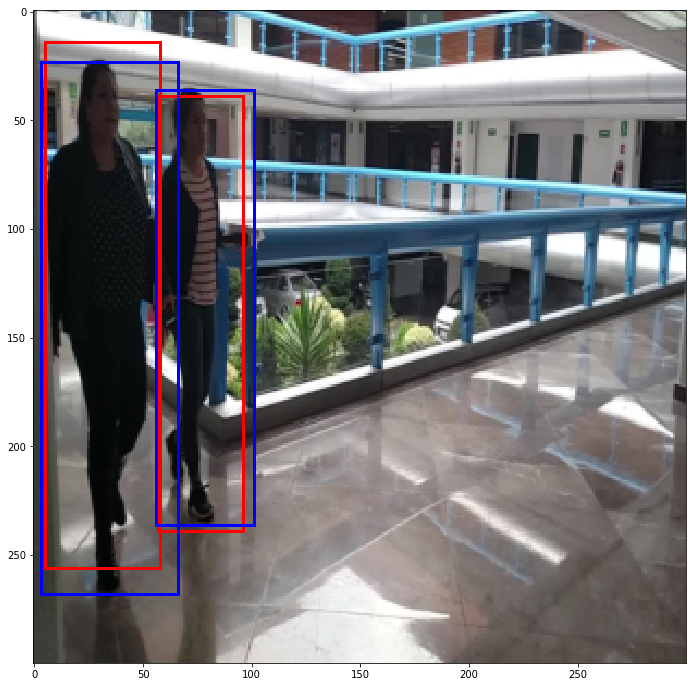

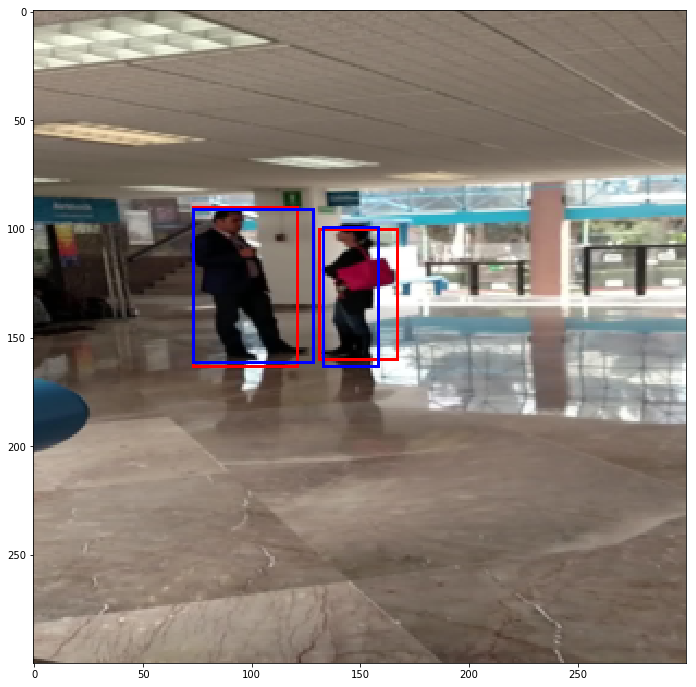

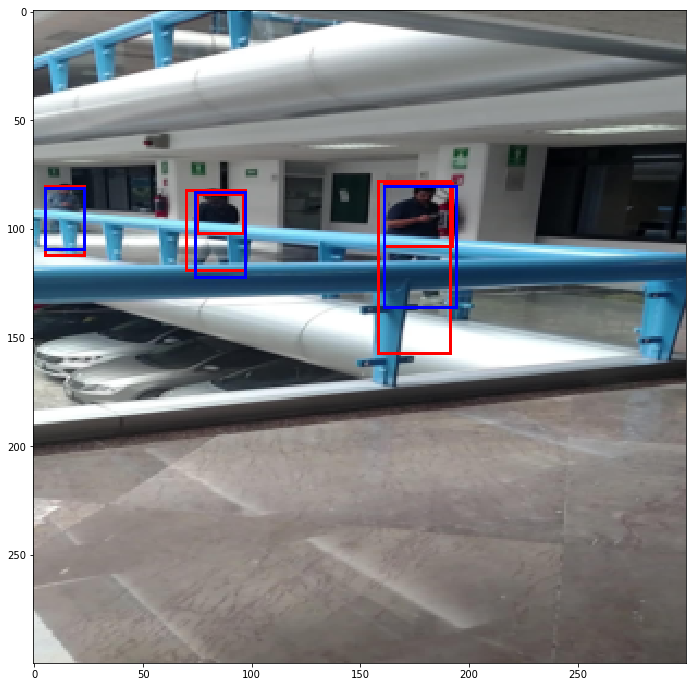

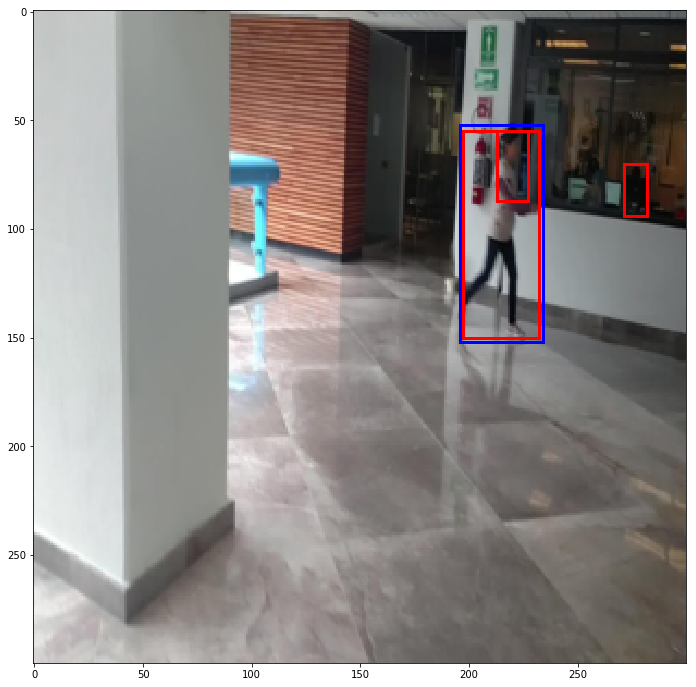

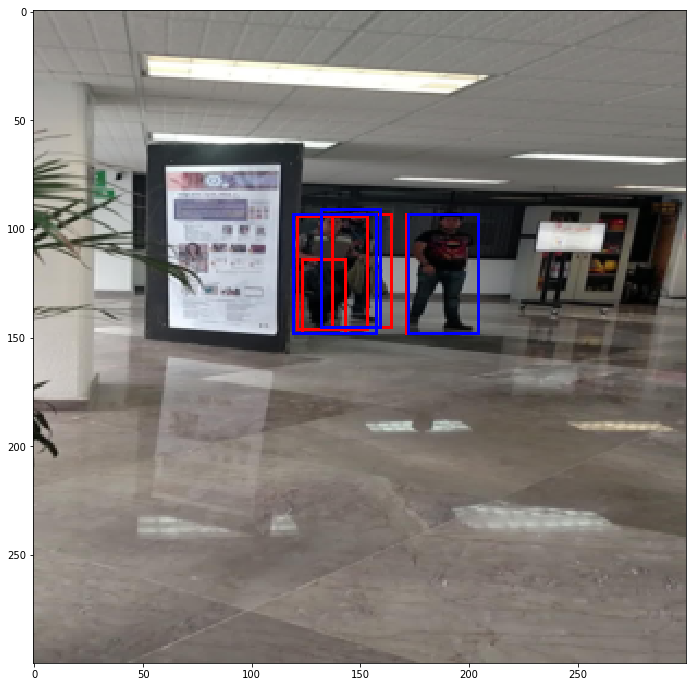

...

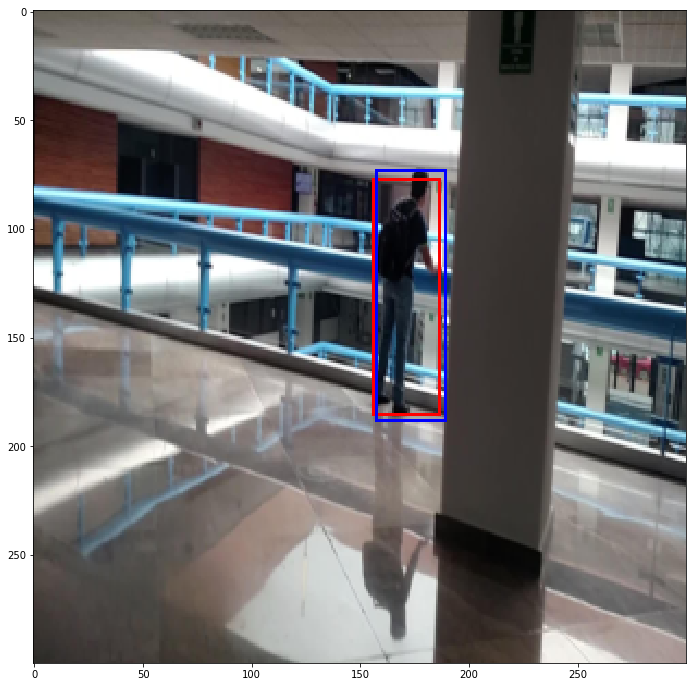

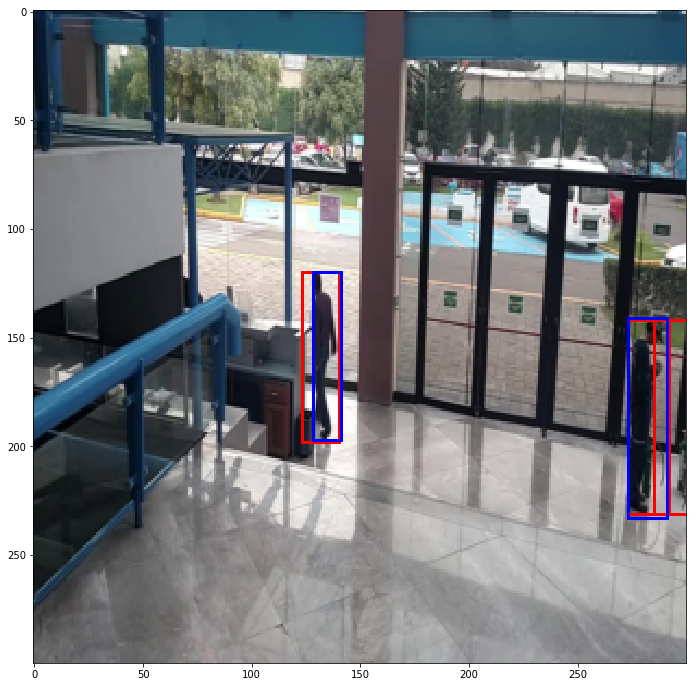

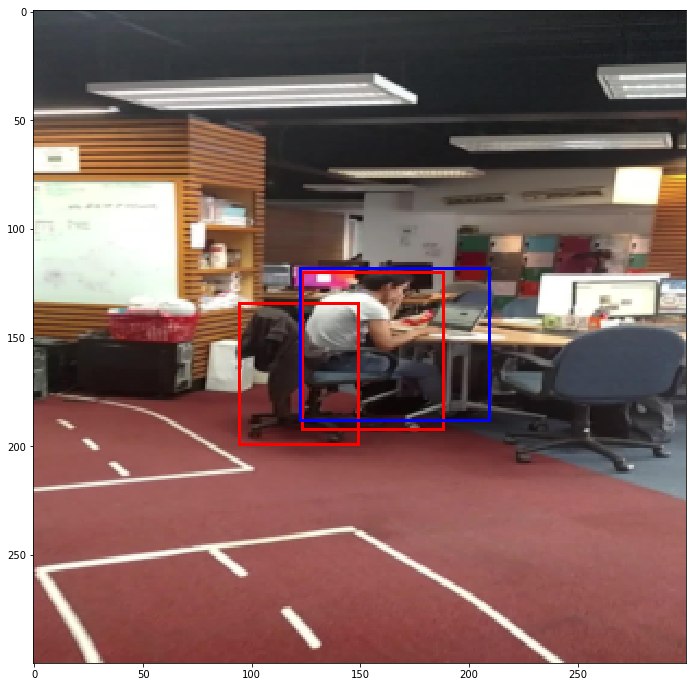

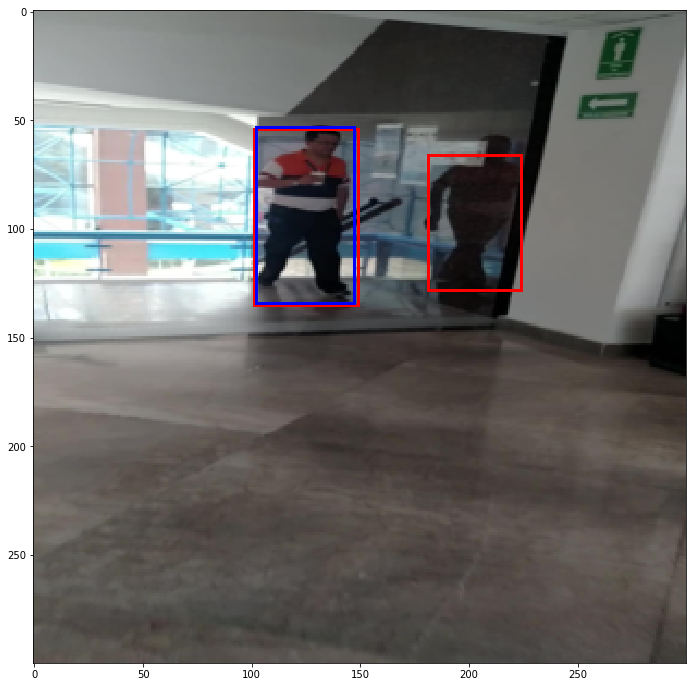

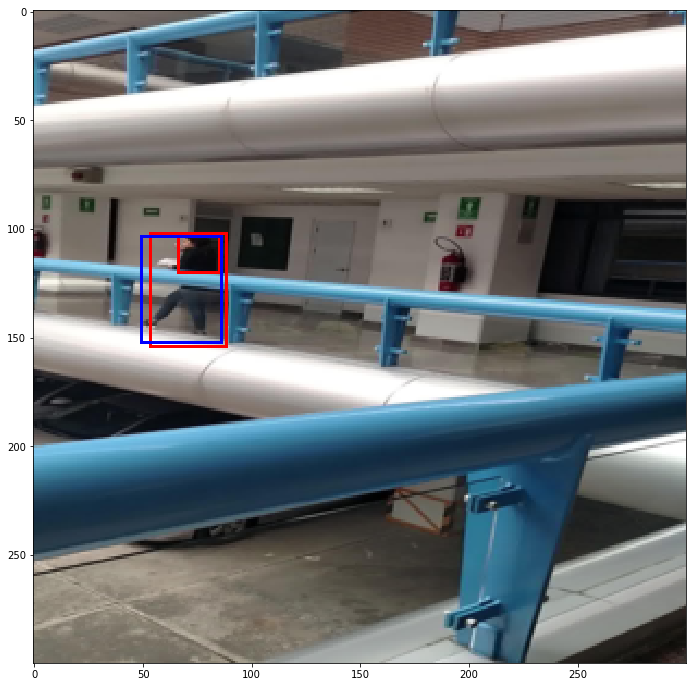

In [27]:
for index in list(range(45)):
    image = test_images_300[index]
    pred = pred_voc_07_12_coco_300x300_test[index]
    label = label_test[index]
    hp.show_image_bb_2(image, pred, label, False)

In [1]:
from keras import backend as K
from keras.models import load_model
from keras.preprocessing import image
from keras.optimizers import Adam
from imageio import imread
import numpy as np
import matplotlib.patches as patches
from matplotlib import pyplot as plt

# from models.keras_ssd300_mobilenetv1 import ssd_300 # mobilenetv1
# from models.keras_ssd300 import ssd_300 # ssd_300 # vgg16
# from models.keras_ssd300_vgg_13_bn import ssd_300 # vgg13
# from models.keras_ssdlite300_mobilenetv1 import ssd_300
from models.keras_ssdlite320_mobilenetv2 import ssd_300
from models.keras_ssd512 import ssd_512
from keras_loss_function.keras_ssd_loss import SSDLoss
from keras_layers.keras_layer_AnchorBoxes import AnchorBoxes
from keras_layers.keras_layer_DecodeDetections import DecodeDetections
from keras_layers.keras_layer_DecodeDetectionsFast import DecodeDetectionsFast
from keras_layers.keras_layer_L2Normalization import L2Normalization

from ssd_encoder_decoder.ssd_output_decoder import decode_detections, decode_detections_fast

from data_generator.object_detection_2d_data_generator import DataGenerator
from data_generator.object_detection_2d_photometric_ops import ConvertTo3Channels
from data_generator.object_detection_2d_geometric_ops import Resize
from data_generator.object_detection_2d_misc_utils import apply_inverse_transforms

from extra_files import helper

%matplotlib inline

Using TensorFlow backend.
/home/aldo/Documents/ssd/data_generator/object_detection_2d_data_generator.py:43: UserWarning: 'BeautifulSoup' module is missing. The XML-parser will be unavailable.
  warnings.warn("'BeautifulSoup' module is missing. The XML-parser will be unavailable.")


In [2]:
def load_model_ssd300(model_path, height, width, num_classes, confidence):
    # 1: Build the Keras model
    K.clear_session() # Clear previous models from memory.

    #scales = [0.1, 0.2, 0.37, 0.54, 0.71, 0.88, 1.05] # pascal
    #scales = [0.07, 0.15, 0.33, 0.51, 0.69, 0.87, 1.05] # coco
    scales = [0.15, 0.33, 0.47, 0.61, 0.76, 0.90, 1.05] # mobilenet
    
    #swap_channels = [2, 1, 0]
    swap_channels = False
    #mean = [123, 117, 104]
    mean = [127, 127, 127]
    #steps = [8, 16, 32, 64, 100, 300]
    #steps = [16, 33, 60, 100, 150, 300]
    #steps =  [15, 30, 60, 100, 150, 300]
    steps = [16, 32, 64, 107, 160, 320] # ssdlite
    
    model = ssd_300(image_size=(height, width, 3),
                    n_classes=num_classes,
                    mode='inference',
                    l2_regularization=0.0005,
                    scales=scales,
                    aspect_ratios_per_layer=[[1.0, 2.0, 0.5],
                                             [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                                             [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                                             [1.0, 2.0, 0.5, 3.0, 1.0/3.0],
                                             [1.0, 2.0, 0.5],
                                             [1.0, 2.0, 0.5]],
                    two_boxes_for_ar1=True,
                    steps=steps,
                    offsets=[0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
                    clip_boxes=False,
                    variances=[0.1, 0.1, 0.2, 0.2],
                    normalize_coords=True,
                    subtract_mean=mean,
                    swap_channels=swap_channels,
                    confidence_thresh=confidence,
                    iou_threshold=0.45,
                    top_k=200,
                    nms_max_output_size=400)

    # 2: Load the trained weights into the model.
    # TODO: Set the path of the trained weights.
    model.load_weights(model_path, by_name=True)

    # 3: Compile the model so that Keras won't complain the next time you load it.

    adam = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)

    ssd_loss = SSDLoss(neg_pos_ratio=3, alpha=1.0)

    model.compile(optimizer=adam, loss=ssd_loss.compute_loss)
    
    return model

In [3]:
def get_predictions(path_model, batch_size, images_list, size_model, num_classes, id_class, confidence=0.15):
    '''
    Make predictions from a model
    path_model: the path to the weights' model
    batch_size: size of the batch
    images_list: list of images to make predictions
    size_model: input size to the model
    '''
    # Create variable to store predictions
    predictions = np.zeros(shape=(1, 200, 6))
    
    model = load_model_ssd300(path_model, size_model, size_model, num_classes, confidence)
    print(model.summary())

    for batch in helper.get_batch(batch_size, images_list):
        pred = model.predict(batch)
        predictions = np.append(predictions, pred, axis=0)
    predictions = predictions[1:] # delete empty item

    clean_pre = helper.clean_predictions(predictions, id_class)
    adjust_pre = helper.adjust_predictions(clean_pre)
    K.clear_session()
    print('finished', path_model)
    return adjust_pre

In [4]:
## Load images
path_root = '../data-cic/preprocess_data'
# test_images_300 = np.load(path_root + '/images_test_300x300.npy')
# label_test = np.load(path_root + '/label_test.npy')
test_images_320 = np.load(path_root + '/images_test_320x320.npy')
label_test_320 = np.load(path_root + '/label_test_320.npy')
label_test_320 = helper.normilize_to_pixel(label_test_320, 320, 320)

In [5]:
model_ssdlite_mobilenetv2 = '../weights/models/ssdlite320_mobilenetv2/ssdlite320_mobilenetv2_pascal_cic.h5'

In [6]:
batch_size_300 = 32

In [8]:
# Make predictions of the models
pred_ssdlitemobilenetv2_pascal_cic = get_predictions(model_ssdlite_mobilenetv2, batch_size_300, test_images_320, 320, 1, 1, 0.20)
pred_ssdlitemobilenetv2_pascal_cic = helper.get_coordinates(pred_ssdlitemobilenetv2_pascal_cic)
pred_ssdlitemobilenetv2_pascal_cic = helper.normilize_to_pixel(pred_ssdlitemobilenetv2_pascal_cic, 320, 320)

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 320, 320, 3)  0                                            
__________________________________________________________________________________________________
identity_layer (Lambda)         (None, 320, 320, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
input_mean_normalization (Lambd (None, 320, 320, 3)  0           identity_layer[0][0]             
__________________________________________________________________________________________________
model_1 (Model)                 multiple             558656      input_mean_normalization[0][0]   
__________________________________________________________________________________________________
mobl13_con

finished ../weights/models/ssdlite320_mobilenetv2/ssdlite320_mobilenetv2_pascal_cic.h5


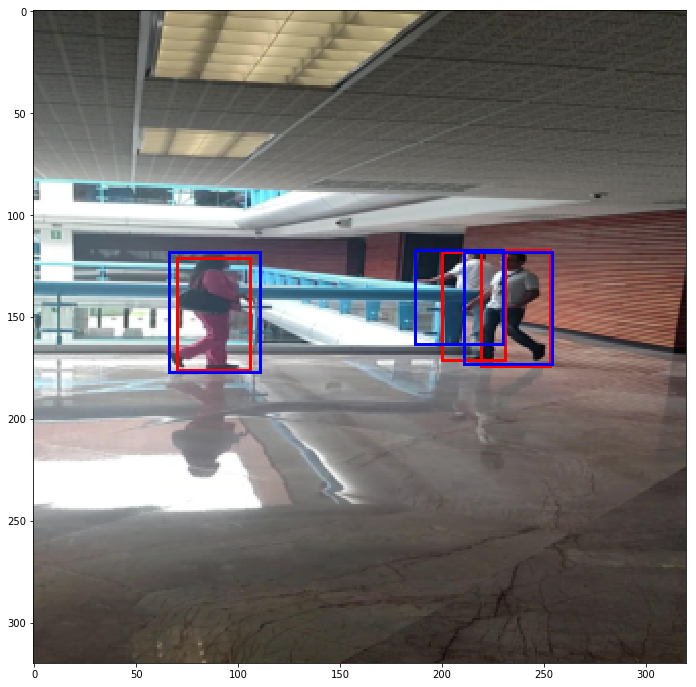

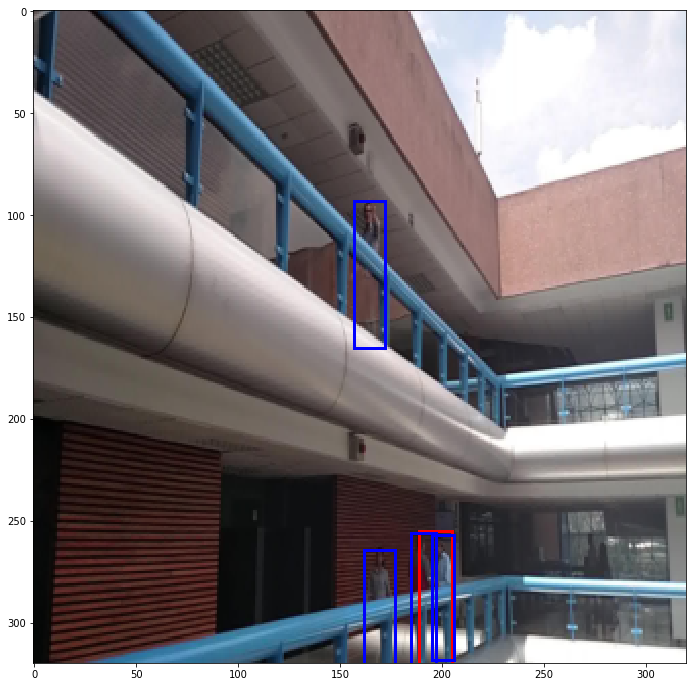

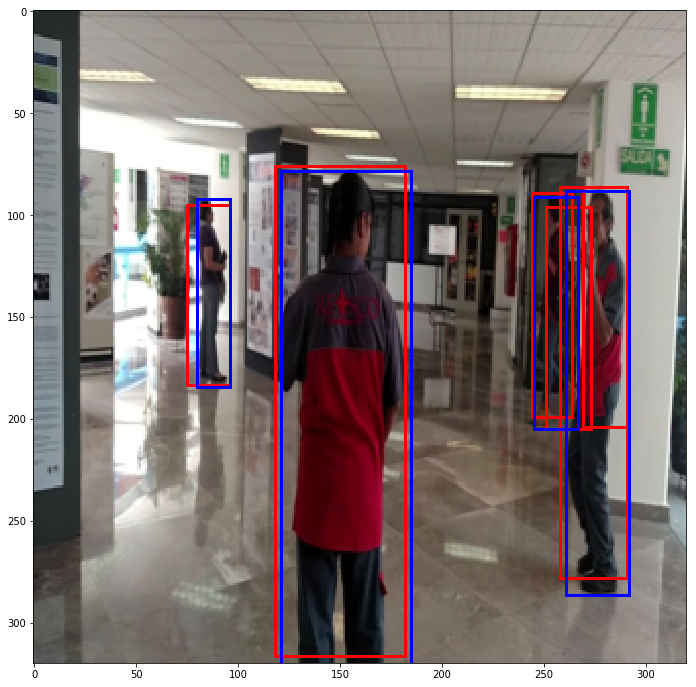

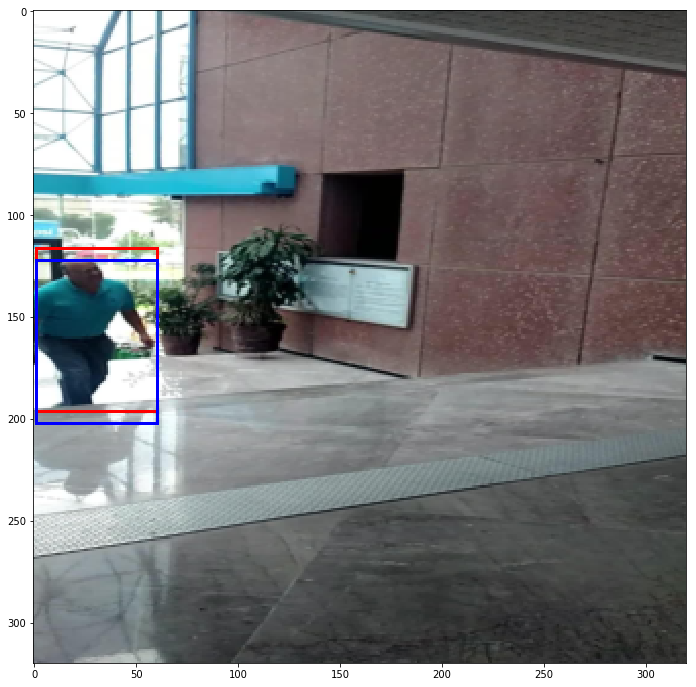

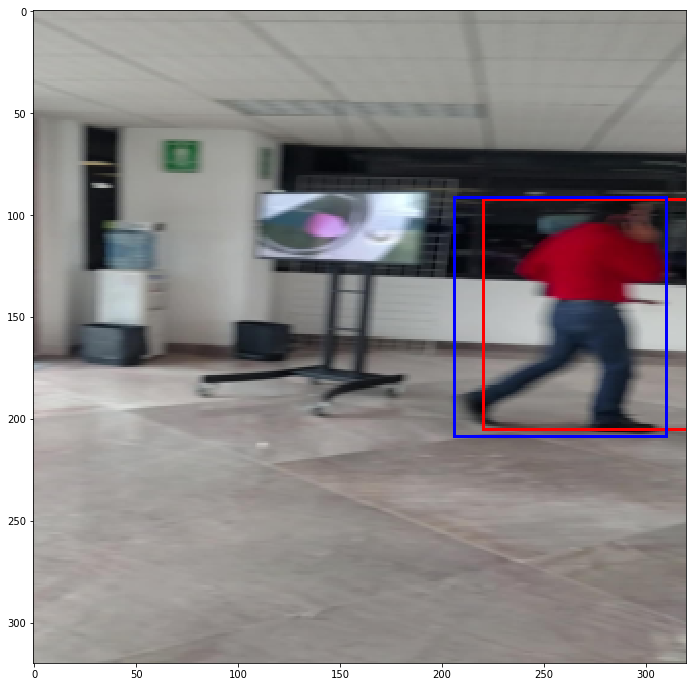

...

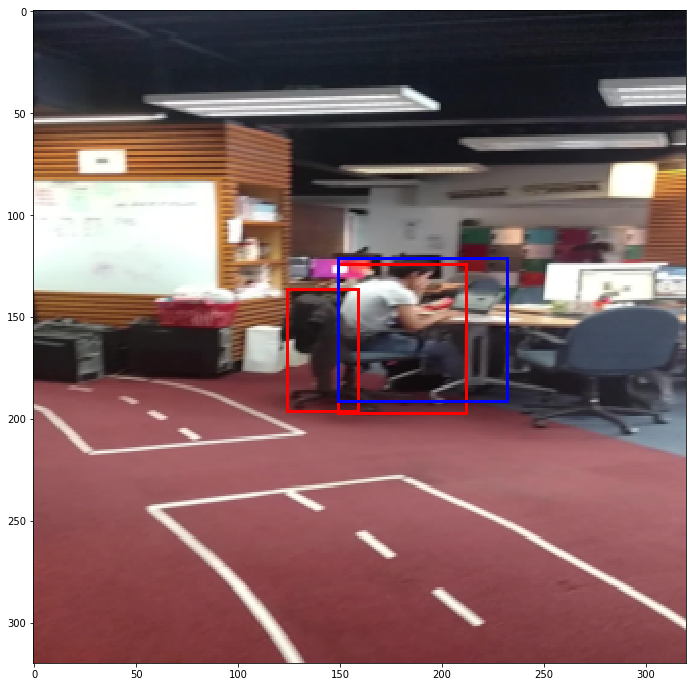

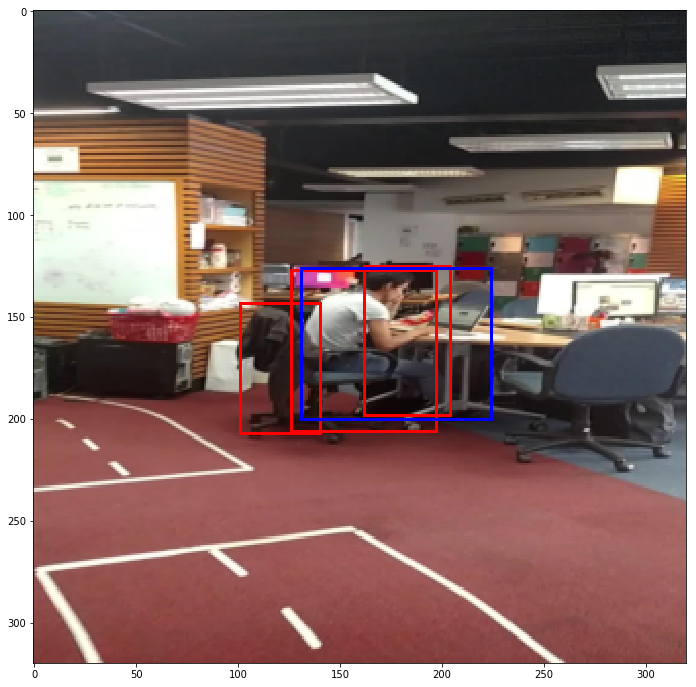

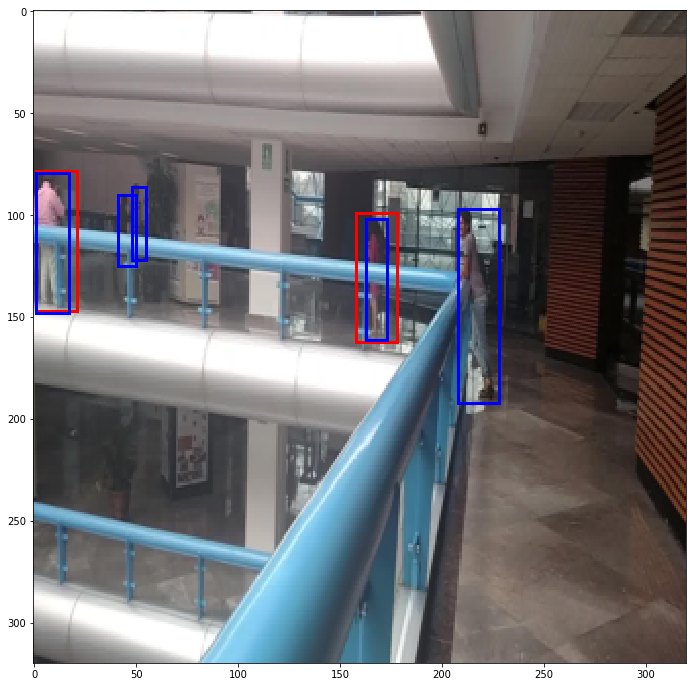

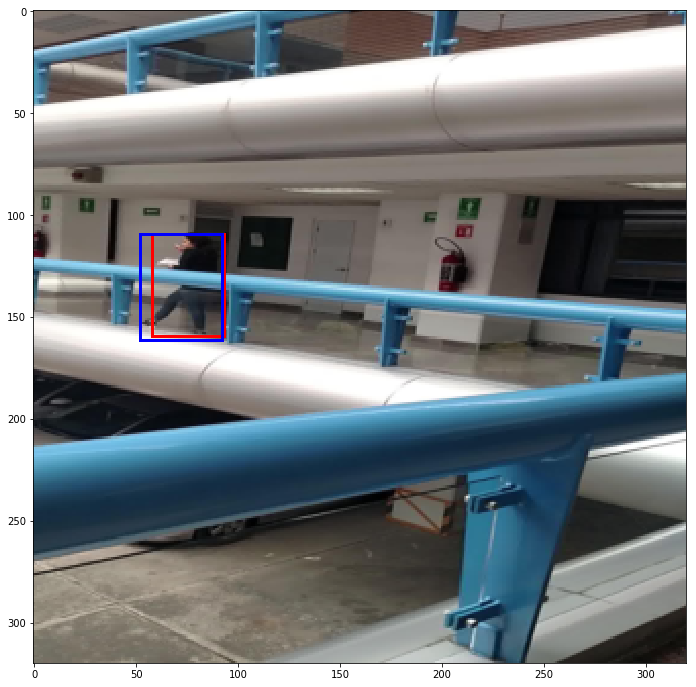

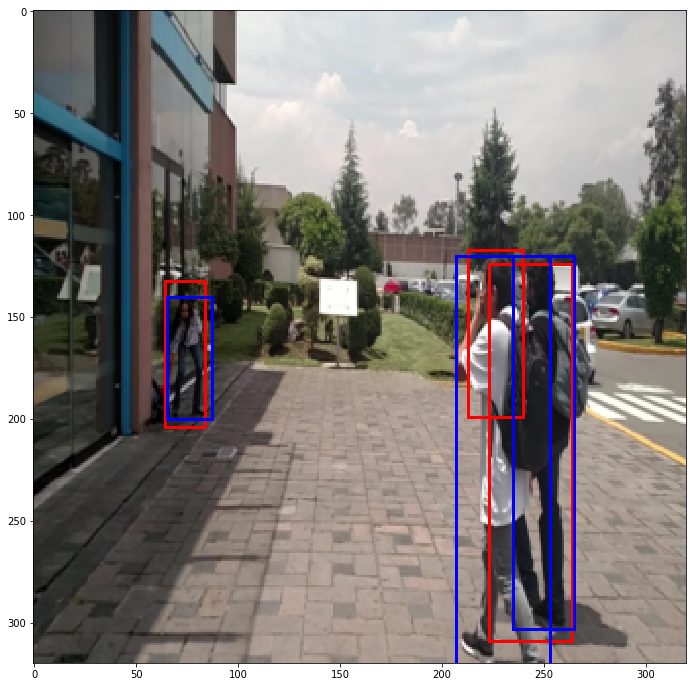

In [10]:
for index in list(range(45)):
    image = test_images_320[index]
    pred = pred_ssdlitemobilenetv2_pascal_cic[index]
    label = label_test_320[index]
    helper.show_image_bb_2(image, pred, label, False)